Downloading dataset

In [2]:
!mkdir /root/.kaggle
!mv kaggle.json /root/.kaggle/.
!chmod 600 /root/.kaggle/kaggle.json

In [3]:
!kaggle datasets download gomayank/rve-elasticity-simulation --unzip

 95% 244M/258M [00:04<00:00, 52.1MB/s]
100% 258M/258M [00:04<00:00, 59.1MB/s]


The complete RVE is fed as single input to the the neural network.

In [4]:
import numpy as np
from sklearn.model_selection import train_test_split
import time, datetime
import tensorflow as tf
from tensorflow.keras import Model, layers, optimizers, losses
from tensorflow import keras
from tensorflow.keras.utils import Sequence, plot_model
from tensorflow.keras.models import load_model
import math
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%reload_ext tensorboard

In [5]:
NUM_CLASSES = 6
NUM_ELEMENTS = 31*31*31
VOLUME_FRACS = (10, 30)
NUM_RVE = 100
E33_MEAN_STD = (0.001, 4.4231E-4)
DATASET_PATH = '/content/'
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)  # Supress warnings

In [ ]:
rve_index = np.arange(NUM_RVE)
train_rves, test_rves = train_test_split(rve_index)

In [ ]:
class RVE_Dataset(Sequence):
    def __init__(self,
                 rve_list,
                 batch_size=32,
                 dataset_path=DATASET_PATH,
                 num_classes=NUM_CLASSES,
                 vol_fracs=VOLUME_FRACS,
                 mean_std=E33_MEAN_STD
                 ):
        self.phase_dist = None
        self.target_value = None
        self.current_class = None
        self.current_volume_fraction = None

        self.rve_list = rve_list
        self.batch_size = batch_size
        self.dataset_path = dataset_path
        self.num_classes = num_classes
        self.vol_fracs = vol_fracs
        self.mean_std = mean_std

        self._files_read = list()
        self._num_samples = self.num_classes*len(self.vol_fracs)*len(self.rve_list)

    def __len__(self):
        return math.ceil(self._num_samples/self.batch_size)

    def __getitem__(self, index):
        indeces = np.arange(index * self.batch_size, min(self._num_samples, (index+1) * self.batch_size))
        x = []
        y = []
        # print('\n',indeces)
        for i in indeces:
            if not(i % len(self.rve_list)):
                self._set_current_variables(i // len(self.rve_list))
                # print(i // len(self.rve_list), self.current_volume_fraction, self.current_class)
                x_meta_data = self._set_phase_distribution()
                y_meta_data = self._set_target_variable()
                if x_meta_data == y_meta_data:
                    self._files_read.append(x_meta_data)
            single_x, single_y = self._get_single_item(i % len(self.rve_list))
            x.append(single_x)
            y.append(single_y)
        return self._preprocess_input(np.asarray(x)), self._preprocess_target(np.asarray(y))
    
    def _preprocess_input(self, x):
        return x - 0.5
    
    def _get_single_item(self, index):
        x = np.expand_dims(self.phase_dist[:, self.rve_list[index]].reshape(31, 31, 31), axis=-1)
        y = np.expand_dims(self.target_value[:, self.rve_list[index]].reshape(31, 31, 31), axis = -1)
        return x, y

    def _set_target_variable(self):
        path = self.dataset_path + 'vol_frac_'+str(self.current_volume_fraction) +\
                '/E33/E33_class_' + str(self.current_class)+'.npy'
        self.target_value = np.load(path)
        return 'Vol frac: {0}; Class: {1}'.format(self.current_volume_fraction, self.current_class)

    def _set_current_variables(self, index):
        self.current_class = (index % self.num_classes) + 1
        index = index//self.num_classes
        self.current_volume_fraction = self.vol_fracs[index % len(self.vol_fracs)]

    def _set_phase_distribution(self):
        path = self.dataset_path + 'vol_frac_'+str(self.current_volume_fraction) +\
                '/phase_distribution/class_' + \
                str(self.current_class)+'.npy'
        self.phase_dist = np.load(path)
        return 'Vol frac: {0}; Class: {1}'.format(self.current_volume_fraction, self.current_class)

    def _preprocess_target(self, y):
        return (y-self.mean_std[0])/self.mean_std[1]

    def files_read(self):
        for element in self._files_read:
            print(element)

In [ ]:
class Sirius(Model):
    def train_step(self, inputs):
        x, y = inputs
        with tf.GradientTape() as tape:
            y_pred = self.call(x)
            loss = self.compiled_loss(y, y_pred)
        # Compute gradients
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        # Update metrics (includes the metric that tracks the loss)
        self.compiled_metrics.update_state(y, y_pred)
        # Return a dict mapping metric names to current value
        return {m.name: m.result() for m in self.metrics}

In [ ]:
keras.backend.clear_session()
fixed_input = layers.Input(shape=(31, 31, 31, 1), name='FixedInput')
x1 = layers.Conv3D(4, (3, 3, 3),
                  activation=keras.activations.relu,
                  name='Conv11')(fixed_input)
x1 = layers.Conv3D(4, (3, 3, 3),
                    activation=keras.activations.relu,
                    name='Conv12')(x1)
x1 = layers.Conv3D(4, (3, 3, 3),
                    activation=keras.activations.relu, padding='same',
                    name='Conv13')(x1)
x2 = layers.MaxPool3D((2, 2, 2), name='AvgPool1')(x1)
x2 = layers.Conv3D(8, (3, 3, 3),
                       activation=keras.activations.relu,
                       name='Conv21')(x2)
x2 = layers.Conv3D(8, (3, 3, 3),
                        activation=keras.activations.relu,
                        name='Conv22')(x2)
x2 = layers.Conv3D(8, (3, 3, 3),
                        activation=keras.activations.relu, padding='same',
                        name='Conv23')(x2)
x2 = layers.Conv3DTranspose(8, (3, 3, 3),strides=(2, 2, 2), name='UpConv1')(x2)
x1 = layers.Cropping3D(((4, 4), (4, 4), (4, 4)), name='Crop1')(x1)
x2 = layers.Concatenate(axis=-1, name='Concat1')([x2, x1])
x2 = layers.Conv3D(6, (3, 3, 3), activation=keras.activations.relu, name='Conv31')(x2)
x2 = layers.Conv3D(4, (3, 3, 3), activation=keras.activations.relu, name='Conv32')(x2)
x2 = layers.Conv3D(4, (3, 3, 3), activation=keras.activations.relu, padding='same', name='Conv33')(x2)
x2 = layers.Conv3DTranspose(4, (3, 3, 3), strides= (2, 2, 2), name='UpConv2')(x2)
x2 = layers.Concatenate(axis=-1, name='Concat2')([x2, fixed_input])
x2 = layers.Conv3D(4, (3, 3, 3), activation=keras.activations.relu, padding='same', name='Conv41')(x2)
x2 = layers.Conv3D(4, (3, 3, 3), activation=keras.activations.relu, padding='same', name='Conv42')(x2)
output  = layers.Conv3D(1, (3, 3, 3), padding='same', activation=None, name='output')(x2)
model = Sirius(inputs=fixed_input, outputs=output)

In [ ]:
model.compile(loss=losses.MeanSquaredError(),
              optimizer=optimizers.Adam(learning_rate=1E-3))
timestap = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = "logs/fit/" + timestamp
model_dir ="Models/" + timestamp
callbacks = [keras.callbacks.ReduceLROnPlateau(moniter="val_loss",
                                               factor=0.8,
                                               patience=5,
                                               min_delta=0.001,
                                               cooldown=10,
                                               verbose=1,
                                               min_lr=5E-5),
             tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)]

In [ ]:
train_subset = RVE_Dataset(train_rves, batch_size=60)
test_subset = RVE_Dataset(test_rves, batch_size=60)

In [ ]:
!rm -rf logs 
tic = time.process_time()
history = model.fit(train_subset, validation_data = test_subset, epochs=250, callbacks=callbacks, workers = 2, use_multiprocessing=True, shuffle=False)
toc = time.process_time()
print('Training completed in {0} seconds'.format(toc-tic))

Training completed in 0.0001184610000013464 seconds


In [ ]:
model.save(model_dir)

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

## Result visualization section

In [6]:
!unzip github_files.zip
!rm github_files.zip

Archive:  github_files.zip
   creating: logs/
   creating: logs/fit/
   creating: logs/fit/20200830-185636/
   creating: logs/fit/20200830-185636/train/
  inflating: logs/fit/20200830-185636/train/events.out.tfevents.1598813797.f1b1a9a9f5fd.102.490.v2  
 extracting: logs/fit/20200830-185636/train/events.out.tfevents.1598813805.f1b1a9a9f5fd.profile-empty  
   creating: logs/fit/20200830-185636/train/plugins/
   creating: logs/fit/20200830-185636/train/plugins/profile/
   creating: logs/fit/20200830-185636/train/plugins/profile/2020_08_30_18_56_45/
  inflating: logs/fit/20200830-185636/train/plugins/profile/2020_08_30_18_56_45/f1b1a9a9f5fd.input_pipeline.pb  
  inflating: logs/fit/20200830-185636/train/plugins/profile/2020_08_30_18_56_45/f1b1a9a9f5fd.kernel_stats.pb  
 extracting: logs/fit/20200830-185636/train/plugins/profile/2020_08_30_18_56_45/f1b1a9a9f5fd.memory_profile.json.gz  
  inflating: logs/fit/20200830-185636/train/plugins/profile/2020_08_30_18_56_45/f1b1a9a9f5fd.overview_pag

In [7]:
model = keras.models.load_model('/content/Models/20200830-185636')

In [8]:
model.summary()

Model: "sirius"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
FixedInput (InputLayer)         [(None, 31, 31, 31,  0                                            
__________________________________________________________________________________________________
Conv11 (Conv3D)                 (None, 29, 29, 29, 4 112         FixedInput[0][0]                 
__________________________________________________________________________________________________
Conv12 (Conv3D)                 (None, 27, 27, 27, 4 436         Conv11[0][0]                     
__________________________________________________________________________________________________
Conv13 (Conv3D)                 (None, 27, 27, 27, 4 436         Conv12[0][0]                     
_____________________________________________________________________________________________

In [9]:
from sklearn.metrics import r2_score
from plotly.subplots import make_subplots

Error in volume fraction 10 class by class

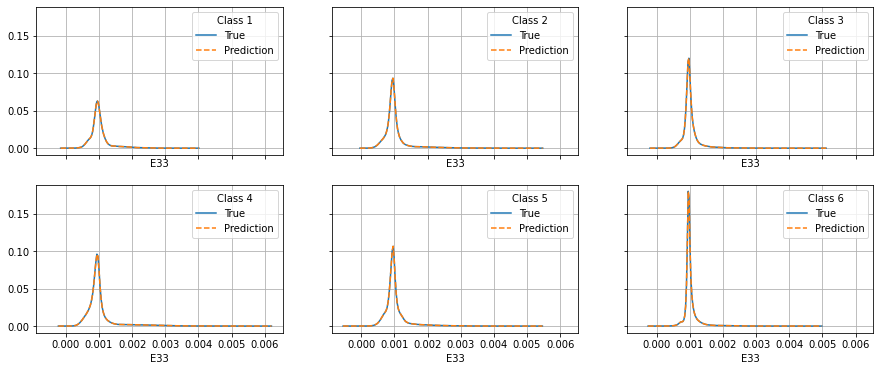

In [ ]:
mean_error_percentage_10 = []
r2_error_10 = []
point_wise_error_10 = []
fig, axs = plt.subplots(nrows=2, ncols=3, sharey=True, sharex=True, figsize=(15, 6))
for class_ in range(6):
    x = np.load('vol_frac_10/phase_distribution/class_{0}.npy'.format(class_+1))
    y = np.load('vol_frac_10/E33/E33_class_{0}.npy'.format(class_+1))
    x = x.T.reshape(100, 31, 31, 31, 1)
    y = y.T.reshape(100, 31, 31, 31, 1)
    x = x - 0.5
    y_pred = model.predict(x)
    y_pred = y_pred*E33_MEAN_STD[1] + E33_MEAN_STD[0]
    y_true_hist, true_bin_edges = np.histogram(y, bins=200)
    y_pred_hist, pred_bin_edges = np.histogram(y, bins=200)
    axs[class_//3, class_%3].plot(true_bin_edges[1:], y_true_hist/sum(y_true_hist), '-', label='True')
    axs[class_//3, class_%3].plot(pred_bin_edges[1:], y_pred_hist/sum(y_pred_hist), '--', label='Prediction')
    axs[class_//3, class_%3].legend(title='Class {0}'.format(class_+1))
    axs[class_//3, class_%3].grid()
    axs[class_//3, class_%3].set_xlabel('E33')
    mean_error_percentage_10.append(np.mean(abs(y_pred-y))/E33_MEAN_STD[0]*100)
    point_wise_error_10.append((y_pred-y).flatten())
    r2_error_10.append(r2_score(y.flatten(), y_pred.flatten()))

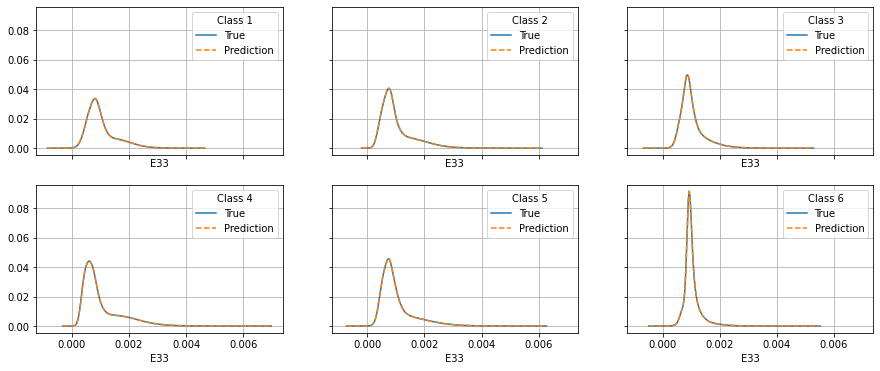

In [10]:
r2_error_30 =[]
mean_error_percentage_30 = []
point_wise_error_30 = []
fig, axs = plt.subplots(nrows=2, ncols=3, sharey=True, sharex=True, figsize=(15, 6))
for class_ in range(6):
    x = np.load('vol_frac_30/phase_distribution/class_{0}.npy'.format(class_+1))
    y = np.load('vol_frac_30/E33/E33_class_{0}.npy'.format(class_+1))
    x = x.T.reshape(100, 31, 31, 31, 1)
    y = y.T.reshape(100, 31, 31, 31, 1)
    x = x - 0.5
    y_pred = model.predict(x)
    y_pred = y_pred*E33_MEAN_STD[1] + E33_MEAN_STD[0]
    y_true_hist, true_bin_edges = np.histogram(y, bins=200)
    y_pred_hist, pred_bin_edges = np.histogram(y, bins=200)
    axs[class_//3, class_%3].plot(true_bin_edges[1:], y_true_hist/sum(y_true_hist), '-', label='True')
    axs[class_//3, class_%3].plot(pred_bin_edges[1:], y_pred_hist/sum(y_pred_hist), '--', label='Prediction')
    axs[class_//3, class_%3].legend(title='Class {0}'.format(class_+1))
    axs[class_//3, class_%3].grid()
    axs[class_//3, class_%3].set_xlabel('E33')
    mean_error_percentage_30.append(np.mean(abs(y_pred-y))/E33_MEAN_STD[0]*100)
    point_wise_error_30.append((y_pred-y).flatten())
    r2_error_30.append(r2_score(y.flatten(), y_pred.flatten()))

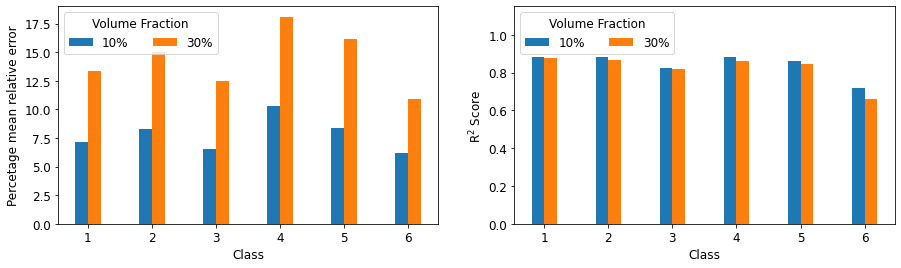

In [ ]:
plt.rcParams['font.size'] = 12
plt.figure(figsize=(15, 4))
plt.subplot(121)
plt.bar(np.arange(len(mean_error_percentage_10))-0.1+1, mean_error_percentage_10, label=r'10%', width=0.2)
plt.bar(np.arange(len(mean_error_percentage_30))+0.1+1, mean_error_percentage_30, label=r'30%', width=0.2)
plt.legend(title='Volume Fraction', loc='upper left', ncol=2)
plt.xlabel('Class')
plt.ylabel('Percetage mean relative error')
plt.subplot(122)
plt.bar(np.arange(len(r2_error_10))-0.1+1, r2_error_10, label=r'10%', width=0.2)
plt.bar(np.arange(len(r2_error_30))+0.1+1, r2_error_30, label=r'30%', width=0.2)
plt.legend(title='Volume Fraction', loc='upper left', ncol=2)
plt.xlabel('Class')
plt.ylabel(r'R$^2$ Score')
plt.ylim([0, 1.15])
plt.show()

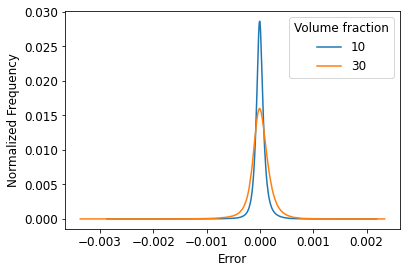

In [ ]:
point_wise_error_10 = np.asarray(point_wise_error_10).flatten()
point_wise_error_30 = np.asarray(point_wise_error_30).flatten()
plt.rcParams['font.size'] = 12
values, edges = np.histogram(point_wise_error_10, bins=1000)
plt.plot(edges[1:], values/sum(values), label='10')
values, edges = np.histogram(point_wise_error_30, bins=1000)
plt.plot(edges[1:], values/sum(values), label='30')
plt.legend(title='Volume fraction')
plt.xlabel('Error')
plt.ylabel('Normalized Frequency')
plt.show()

In [11]:
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{'type': 'volume'}, {'type': 'volume'}],
           [{'type': 'volume'}, {'type': 'volume'}]],
    subplot_titles=("True E33", "Predicted E33", "Phase distribution", "Error"),
    horizontal_spacing = 0.1)
N = 31
Z, Y, X = np.meshgrid(np.arange(N), np.arange(N), np.arange(N))
x = np.load('vol_frac_{0}/phase_distribution/class_{1}.npy'.format(10, 1))[:, 10]
y = np.load('vol_frac_{0}/E33/E33_class_{1}.npy'.format(10, 1))[:, 10]
x = x.reshape(1, 31, 31, 31, 1) - 0.5
y_pred = model.predict(x).flatten() * E33_MEAN_STD[1] + E33_MEAN_STD[0]

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=y, 
        opacity=0.1,
        surface_count=10,
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_x = 0.45,
        colorbar_y = 0.8
        ), row=1, col=1)

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=y_pred, 
        opacity=0.1,
        surface_count=10, 
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_y = 0.8
        ), row=1, col=2)

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=x.flatten(), 
        opacity=0.1,
        surface_count=10,
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_x = 0.45,
        colorbar_y = 0.2
        ), row=2, col=1)

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=abs(y-y_pred), 
        opacity=0.1,
        surface_count=10,
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_y = 0.2
        ), row=2, col=2)
fig.show()

In [ ]:
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{'type': 'volume'}, {'type': 'volume'}],
           [{'type': 'volume'}, {'type': 'volume'}]],
    subplot_titles=("True E33", "Predicted E33", "Phase distribution", "Error"),
    horizontal_spacing = 0.1)
N = 31
Z, Y, X = np.meshgrid(np.arange(N), np.arange(N), np.arange(N))
x = np.load('vol_frac_{0}/phase_distribution/class_{1}.npy'.format(30, 1))[:, 10]
y = np.load('vol_frac_{0}/E33/E33_class_{1}.npy'.format(30, 1))[:, 10]
x = x.reshape(1, 31, 31, 31, 1) - 0.5
y_pred = model.predict(x).flatten() * E33_MEAN_STD[1] + E33_MEAN_STD[0]

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=y, 
        opacity=0.1,
        surface_count=10,
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_x = 0.45,
        colorbar_y = 0.8,
        colorscale = 'Plasma',
        ), row=1, col=1)

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=y_pred, 
        opacity=0.1,
        surface_count=10, 
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_y = 0.8,
        colorscale = 'Plasma',
        ), row=1, col=2)

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=x.flatten(), 
        opacity=0.1,
        surface_count=10,
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_x = 0.45,
        colorbar_y = 0.2
        ), row=2, col=1)

fig.add_trace(go.Volume(
        x=X.flatten(), 
        y=Y.flatten(), 
        z=Z.flatten(), 
        value=abs(y-y_pred), 
        opacity=0.1,
        surface_count=10,
        colorbar=dict(lenmode='fraction', len=0.5),
        colorbar_y = 0.2,
        colorscale = 'Plasma',
        ), row=2, col=2)
fig.show()